## Load In Dependencies

In [1]:
# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.basemap import Basemap
import folium

# Data Science
import numpy as np
import pandas as pd
import statsmodels.api as sm
import statsmodels.formula.api as smf

# Multi-dimensional arrays and datasets
import xarray as xr

# Geospatial raster data handling
import rioxarray as rxr

# Geospatial data analysis
import geopandas as gpd

# Geospatial operations
import rasterio
from rasterio import windows  
from rasterio import features  
from rasterio import warp
from rasterio.warp import transform_bounds 
from rasterio.windows import from_bounds 

# Image Processing
from PIL import Image

# Coordinate transformations
from pyproj import Proj, Transformer, CRS

# Feature Engineering
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Machine Learning
from sklearn.ensemble import RandomForestRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from sklearn.metrics import r2_score

# Planetary Computer Tools
import pystac_client
import planetary_computer as pc
from pystac.extensions.eo import EOExtension as eo

# Others
import os
from tqdm import tqdm
import sys

from sklearn.datasets import make_friedman1
from sklearn.feature_selection import RFE
from sklearn.svm import SVR

from sklearn.pipeline import Pipeline
from xgboost import XGBRegressor, XGBClassifier
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import RFE
from sklearn.mixture import GaussianMixture


In [299]:
sys.path.append(os.path.abspath("../ml_pipeline"))
import ml_models
save_folder = "../ml_pipeline/diagnostic_data/"

In [167]:
# Load the training data from csv file and display the first few rows to inspect the data
ground_df = pd.read_csv("../Training_data_uhi_index_2025-02-18.csv")
ground_df.head()

,Longitude,Latitude,datetime,UHI Index
0,-73.909167,40.813107,24-07-2021 15:53,1.030289
1,-73.909187,40.813045,24-07-2021 15:53,1.030289
2,-73.909215,40.812978,24-07-2021 15:53,1.023798
3,-73.909242,40.812908,24-07-2021 15:53,1.023798
4,-73.909257,40.812845,24-07-2021 15:53,1.021634


In [168]:
data_folder = "../data_pipeline/data/tabular_data/train/1x1"
for i, filename in tqdm(enumerate(os.listdir(data_folder))):
    if filename.endswith(".csv"):
        file_path = os.path.join(data_folder, filename)
        df = pd.read_csv(file_path)
        df = df.iloc[:, 2:]
        ground_df = pd.concat([ground_df, df], axis=1)

data_folder = "../data_pipeline/data/tabular_data/train/3x3"
for i, filename in tqdm(enumerate(os.listdir(data_folder))):
    if filename.endswith(".csv"):
        file_path = os.path.join(data_folder, filename)
        df = pd.read_csv(file_path)
        df = df.iloc[:, 2:]
        ground_df = pd.concat([ground_df, df], axis=1)

data_folder = "../data_pipeline/data/tabular_data/train/5x5"
for i, filename in tqdm(enumerate(os.listdir(data_folder))):
    if filename.endswith(".csv"):
        file_path = os.path.join(data_folder, filename)
        df = pd.read_csv(file_path)
        df = df.iloc[:, 2:]
        ground_df = pd.concat([ground_df, df], axis=1)

data_folder = "../data_pipeline/data/tabular_data/train/9x9"
for i, filename in tqdm(enumerate(os.listdir(data_folder))):
    if filename.endswith(".csv"):
        file_path = os.path.join(data_folder, filename)
        df = pd.read_csv(file_path)
        df = df.iloc[:, 2:]
        ground_df = pd.concat([ground_df, df], axis=1)

data_folder = "../data_pipeline/data/tabular_data/train/15x15"
for i, filename in tqdm(enumerate(os.listdir(data_folder))):
    if filename.endswith(".csv"):
        file_path = os.path.join(data_folder, filename)
        df = pd.read_csv(file_path)
        df = df.iloc[:, 2:]
        ground_df = pd.concat([ground_df, df], axis=1)


data_folder = "../data_pipeline/data/tabular_data/train/25x25"
for i, filename in tqdm(enumerate(os.listdir(data_folder))):
    if filename.endswith(".csv"):
        file_path = os.path.join(data_folder, filename)
        df = pd.read_csv(file_path)
        df = df.iloc[:, 2:]
        ground_df = pd.concat([ground_df, df], axis=1)


data_folder = "../data_pipeline/data/tabular_data/train/51x51"
for i, filename in tqdm(enumerate(os.listdir(data_folder))):
    if filename.endswith(".csv"):
        file_path = os.path.join(data_folder, filename)
        df = pd.read_csv(file_path)
        df = df.iloc[:, 2:]
        ground_df = pd.concat([ground_df, df], axis=1)

58it [00:02, 20.98it/s]
73it [00:15,  4.86it/s]
71it [00:19,  3.63it/s]
71it [00:23,  2.97it/s]
63it [00:24,  2.53it/s]
29it [00:14,  1.96it/s]
29it [00:16,  1.81it/s]


In [7]:
list(ground_df.columns)

['Longitude',
 'Latitude',
 'datetime',
 'UHI Index',
 'aod47',
 'aod55',
 'building_height_res100',
 'building_height_std_res100',
 'building_year_res100',
 'building_area_res100',
 'building_height_res30',
 'building_height_std_res30',
 'building_year_res30',
 'building_area_res30',
 'var_res100',
 'building_area_per_pixel_res100',
 'var_res30',
 'building_area_per_pixel_res30',
 'Unnamed: 4',
 'canopy_heigth',
 'canopy_heigth_res10',
 'canopy_heigth_count_res10',
 'canopy_heigth_res30',
 'canopy_heigth_count_res30',
 'canopy_heigth_res5',
 'canopy_heigth_count_res5',
 'co_july24',
 'segment_avg_length_res100',
 'segment_count_res100',
 'segment_total_length_res100',
 'degree_orientation_res100',
 'entropy_orientation_res100',
 'mean_circuity_res100',
 'segment_avg_length_res1000',
 'segment_count_res1000',
 'segment_total_length_res1000',
 'degree_orientation_res1000',
 'entropy_orientation_res1000',
 'mean_circuity_res1000',
 'segment_avg_length_res30',
 'segment_count_res30',
 'se

In [4]:
len(ground_df.columns)

3239

In [215]:
col_prefix = ['aod55', 'o3', 'co', 'hcho', 'no2', 'building', 'var', 'street', 'has', 'overlay_level1_res30', 
              'zonedist_level1_res30', 'population', 'canopy', 'high_way', 'mean_stump', 'mean_dbh', 'condition', 'structure', 'tree_count',
              'landsat_8_albedo', 'landsat_8_awei', 'lwir', 'landsat_8_ibi', 
              'landsat_8_ndvi', 'landsat_8_evi', 'landsat_8_savi', 'landsat_8_gndvi', 
              'landsat_8_arvi', 
              'landsat_8_msavi', 
              'landsat_8_ndbi', 
              'landsat_8_ndwi', 'landsat_8_si', 'landsat_8_ui', 'sentinel_2',
              'connectivity', 'node_density', 'entropy_degree',  'closeness', 'intersection',
              'segment_avg_length', 'segment_count', 'segment_total_length', 'degree_orientation', 'entropy_orientation', 'mean_circuity',
              'surface', 'water', 'ventilation', 'subway_station', 'cooling_tower', 'green_infra'
              ]

# col_suffix = []
cols = [col for col in ground_df.columns 
        if any(col.startswith(prefix) for prefix in col_prefix)
        # and not all(col.endswith(suffix) for suffix in col_suffix)
        ]


data = ground_df[cols + ['UHI Index']].copy()
drop_prefix = ['has', 'overlay', 'street_orientation', 'street_traffic', 'zonedist']
drop_suffix = ['3x3', '5x5', '9x9', '15x15', '25x25', '51x51']
drop_cols = [col for col in data.columns
    if (any(col.startswith(prefix) for prefix in drop_prefix) and any(col.endswith(suffix) for suffix in drop_suffix))
    or col.startswith('building_area_res')]

data = data.drop(columns=drop_cols)

categorical_cols = ['has_commercial_res100',
 'has_commercial_res1000',
 'has_commercial_res200',
 'has_commercial_res30',
 'has_commercial_res500',
 'has_manufacture_res100',
 'has_manufacture_res1000',
 'has_manufacture_res200',
 'has_manufacture_res30',
 'has_manufacture_res500',
 'has_park_res100',
 'has_park_res1000',
 'has_park_res200',
 'has_park_res30',
 'has_park_res500',
 'has_residence_res100',
 'has_residence_res1000',
 'has_residence_res200',
 'has_residence_res30',
 'has_residence_res500',
 'overlay_level1_res30',
 'street_orientation_res100',
 'street_orientation_res30',
 'street_traffic_res100',
 'street_traffic_res30',
 'high_way_res1000',
 'high_way_res500',
 'high_way_res100',
 'high_way_res30',
 'street_type_res1000',
 'street_type_res500',
 'street_type_res100',
 'street_type_res30',
 'zonedist_level1_res30']

numerical_cols = list(set(data.columns) - set(categorical_cols) - set(['UHI Index']))



In [6]:
col_lst = list(data.columns)
col_lst.sort()
col_lst

['UHI Index',
 'aod55',
 'aod55_ASM_15x15',
 'aod55_ASM_3x3',
 'aod55_ASM_5x5',
 'aod55_ASM_9x9',
 'aod55_contrast_15x15',
 'aod55_contrast_3x3',
 'aod55_contrast_5x5',
 'aod55_contrast_9x9',
 'aod55_correlation_15x15',
 'aod55_correlation_3x3',
 'aod55_correlation_5x5',
 'aod55_correlation_9x9',
 'aod55_dissimilarity_15x15',
 'aod55_dissimilarity_3x3',
 'aod55_dissimilarity_5x5',
 'aod55_dissimilarity_9x9',
 'aod55_energy_15x15',
 'aod55_energy_3x3',
 'aod55_energy_5x5',
 'aod55_energy_9x9',
 'aod55_homogeneity_15x15',
 'aod55_homogeneity_3x3',
 'aod55_homogeneity_5x5',
 'aod55_homogeneity_9x9',
 'aod55_mean_15x15',
 'aod55_mean_3x3',
 'aod55_mean_5x5',
 'aod55_mean_9x9',
 'aod55_std_dev_15x15',
 'aod55_std_dev_3x3',
 'aod55_std_dev_5x5',
 'aod55_std_dev_9x9',
 'building_area_per_pixel_res100',
 'building_area_per_pixel_res100_ASM_15x15',
 'building_area_per_pixel_res100_ASM_25x25',
 'building_area_per_pixel_res100_ASM_3x3',
 'building_area_per_pixel_res100_ASM_51x51',
 'building_area

In [176]:
import sys
import os

sys.path.append(os.path.abspath("../src"))
import eda
# from src.eda import EDA

stat_eda = eda.EDA(data)
stat_eda.explore_stats().to_csv('eda_features_selected.csv', index=False)

In [6]:
df3 = data[[col for col in data.columns if col.endswith("3x3")]].copy()
df5 = data[[col for col in data.columns if col.endswith("5x5")]].copy()
df9 = data[[col for col in data.columns if col.endswith("9x9")]].copy()
df15 = data[[col for col in data.columns if col.endswith("15x15")]].copy()
df25 = data[[col for col in data.columns if col.endswith("25x25")]].copy()
df51 = data[[col for col in data.columns if col.endswith("51x51")]].copy()

## Multi-staged modelling

In [ ]:
col_prefix = [
    # 'canopy',
              'landsat_8_albedo', 
              'landsat_8_awei', 
              'lwir', 
              'landsat_8_ibi', 
              'landsat_8_arvi', 
              'landsat_8_ndbi', 
              'landsat_8_ndwi', 
              'landsat_8_si', 
              'landsat_8_ui', 
              'coastal', 
              # 'swir',
            #   'surface',
              ]

col_suffix = [
    'mean_51x51', 'std_dev_51x51', 'contrast_51x51', 'energy_51x51', 
        #       'dissimilarity_51x51', 
        # 'homogeneity_51x51', 
        # 'correlation_51x51', 
        'ASM_51x51',
              'mean_9x9', 'std_dev_9x9', 'contrast_9x9', 'energy_9x9',
              # 'dissimilarity_9x9', 
            # 'homogeneity_9x9', 
            # 'correlation_9x9', 
            'ASM_9x9',
            # 'mean_5x5', 'std_dev_5x5', 'contrast_5x5', 'energy_5x5',
              # 'dissimilarity_9x9', 
            # 'homogeneity_9x9', 
            # 'correlation_9x9', 
            # 'ASM_5x5',
              ]
numerical_cols = [col for col in data.columns 
        if any(col.startswith(prefix) for prefix in col_prefix)
        and any(col.endswith(suffix) for suffix in col_suffix)
        ]

others = ['building_height_res100', 'building_height_std_res100', 'building_year_res100', 'var_res100', 
          'building_area_per_pixel_res100', 
          'population_res1000', 
          'building_height_res100_mean_15x15', 'building_height_res100_std_dev_15x15', 
          'building_year_res100_mean_15x15', 
          'building_height_res100_mean_9x9', 'building_height_res100_std_dev_9x9', 
          'building_height_res100_mean_51x51', 'building_height_res100_std_dev_51x51', 
          'building_year_res100_mean_51x51', 'building_year_res100_mean_9x9', 
          'surface_elevation_res100', 
          'no2_july24', 
          # 'aod55', 'hcho_july24', 'co_july24', 'o3_july24',
          # 'water_area_res1000', 
          'landsat_8_albedo', 
              'landsat_8_awei_sh', 
              'landsat_8_awei_nsh', 
              'lwir11', 
              'landsat_8_ibi', 
              'landsat_8_arvi', 
              'landsat_8_ndbi', 
              'landsat_8_ndwi', 
              'landsat_8_si', 
              'landsat_8_ui', 
              'coastal', 
              'sentinel_2_albedo', 
              'sentinel_2_awei_sh', 
              'sentinel_2_awei_nsh',  
              'sentinel_2_ibi', 
              'sentinel_2_arvi', 
              'sentinel_2_ndbi', 
              'sentinel_2_ndwi', 
              'sentinel_2_si', 
              'sentinel_2_ui', 
              # 'coastal', 
          'water_area_res100', 
          'street_width_res100',
          'ventilation_res100',
          'subway_station_res100',
          'subway_station_res500',
          'subway_station_res1000',
          'water_area_res500', 
          'cooling_tower_res100',
          'cooling_tower_res500',
          # 'green_infra_res500',
          # 'green_infra_res100',
          # 'cooling_tower_res1000',
          # 'cooling_tower_res30',
          # 'water_area_res100',
  'closeness_1000_res100',
#  'closeness_1000_res1000',
#  'closeness_1000_res30',
 'closeness_1000_res500',
 'closeness_100_res100',
#  'closeness_100_res1000',
#  'closeness_100_res30',
 'closeness_100_res500',
 'closeness_500_res100',
#  'closeness_500_res1000',
#  'closeness_500_res30',
 'closeness_500_res500',
#  'connectivity_res100',
 'connectivity_res1000',
#  'connectivity_res30',
 'connectivity_res500',
#  'degree_orientation_res100',
 'degree_orientation_res1000',
#  'degree_orientation_res30',
 'degree_orientation_res500',
#  'entropy_degree_res100',
 'entropy_degree_res1000',
#  'entropy_degree_res30',
 'entropy_degree_res500',
#  'entropy_orientation_res100',
 'entropy_orientation_res1000',
#  'entropy_orientation_res30',
 'entropy_orientation_res500',
 'intersection_res100',
#  'intersection_res1000',
 'intersection_res30',
#  'intersection_res500',
 'mean_circuity_res100',
 'mean_circuity_res1000',
#  'mean_circuity_res30',
#  'mean_circuity_res500',
#  'node_density_res100',
#  'node_density_res1000',
#  'node_density_res30',
#  'node_density_res500',
 'segment_avg_length_res100',
 'segment_avg_length_res1000',
 'segment_avg_length_res30',
 'segment_avg_length_res500',
#  'segment_count_res100',
#  'segment_count_res1000',
#  'segment_count_res30',
#  'segment_count_res500',
#  'segment_total_length_res100',
#  'segment_total_length_res1000',
#  'segment_total_length_res30',
#  'segment_total_length_res500',
'mean_stump_res30', 
'mean_dbh_res30', 
'mean_stump_res100', 
'mean_dbh_res100', 
'tree_count_res30',
'tree_count_res100',
'tree_count_res500',
          ]
numerical_cols = others + numerical_cols

categorical_cols = [
    # 'condition_res30', 'structure_res30',
 'street_orientation_res30',
 'street_traffic_res30',
 'high_way_res1000',
 'high_way_res500',
 'high_way_res100',
 'high_way_res30',
#  'street_type_res1000',
#  'street_type_res500',
#  'street_type_res100',
#  'street_type_res30',
 'has_manufacture_res30',
 'has_park_res30',
 'has_residence_res30',
 'has_commercial_res30',
 'has_manufacture_res100',
 'has_park_res100',
 'has_residence_res100',
 'has_commercial_res100',
# 'has_manufacture_res200',
#  'has_park_res200',
 'has_manufacture_res500',
 'has_park_res500',
 'has_residence_res500',
 'has_commercial_res500',
 'has_manufacture_res1000',
 'has_park_res1000',
 'has_residence_res1000',
 'has_commercial_res1000',
 ]

# numerical_cols = list(set(data.columns) - set(categorical_cols) - set(['UHI Index']))

In [217]:
len(numerical_cols)

185

In [13]:
list(data.columns)

['aod55',
 'building_height_res100',
 'building_height_std_res100',
 'building_year_res100',
 'building_height_res30',
 'building_height_std_res30',
 'building_year_res30',
 'var_res100',
 'building_area_per_pixel_res100',
 'var_res30',
 'building_area_per_pixel_res30',
 'canopy_heigth',
 'canopy_heigth_res10',
 'canopy_heigth_count_res10',
 'canopy_heigth_res30',
 'canopy_heigth_count_res30',
 'canopy_heigth_res5',
 'canopy_heigth_count_res5',
 'cooling_tower_res100',
 'cooling_tower_res1000',
 'cooling_tower_res30',
 'cooling_tower_res500',
 'co_july24',
 'segment_avg_length_res100',
 'segment_count_res100',
 'segment_total_length_res100',
 'degree_orientation_res100',
 'entropy_orientation_res100',
 'mean_circuity_res100',
 'segment_avg_length_res1000',
 'segment_count_res1000',
 'segment_total_length_res1000',
 'degree_orientation_res1000',
 'entropy_orientation_res1000',
 'mean_circuity_res1000',
 'segment_avg_length_res30',
 'segment_count_res30',
 'segment_total_length_res30',
 

In [218]:
train_data = data[['UHI Index'] + categorical_cols + numerical_cols]
train_data.duplicated().sum()

1092

In [30]:
train_data.corr().to_csv("corr_street_node.csv")

In [219]:
train_data = train_data[['UHI Index'] + categorical_cols + numerical_cols].drop_duplicates()
# train_data = train_data[['UHI Index'] + categorical_cols + numerical_cols]

In [220]:
from sklearn.model_selection import train_test_split

bins = pd.cut(train_data['UHI Index'], bins=50)
X_train, X_test, y_train, y_test = train_test_split(train_data.drop(columns=['UHI Index']), train_data['UHI Index'],
                                                    test_size=0.3, random_state=33,
                                                    stratify=bins
                                                    )

df_train = X_train.copy()
df_train['y_true'] = y_train.values

bins = bins[X_test.index]
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test,
                                                test_size=0.5, random_state=33,
                                                stratify=bins
                                                )

df_val = X_val.copy()
df_val['y_true'] = y_val.values
df_test = X_test.copy()
df_test['y_true'] = y_test.values

train_idx = df_train.index
val_idx = df_val.index
test_idx = df_test.index

### Stacking

In [18]:
from sklearn.preprocessing import OneHotEncoder, FunctionTransformer, PowerTransformer
from sklearn.compose import ColumnTransformer

def power_transform_exclude_neg1(X):
    X = X.copy()
    mask = X == 0  # Identify -1 values
    X[mask] = np.nan  # Temporarily replace -1 with NaN
    X = PowerTransformer().fit_transform(X)  # Apply PowerTransformer
    X[mask] = -10  # Restore -1 values
    return X

def create_feature_engineering_pipeline(numerical_features, categorical_features):
    # power_trans = ColumnTransformer([
    #     ('power', FunctionTransformer(power_transform_exclude_neg1), power_cols),  # Power transform with exclusion
    #     ('identity', FunctionTransformer(), list(set(numerical_features) - set(power_cols)))  # Keep other columns unchanged
    # ])

    num_transformer = Pipeline([
        # ('preprocessing', power_trans),
        ("scaler", MinMaxScaler())
    ])

    cat_transformer = Pipeline([
        ("encoder", OneHotEncoder(drop='first'))
    ])

    preprocessor = ColumnTransformer([
        ("num", num_transformer, numerical_features),
        ("cat", cat_transformer, categorical_features)
    ])

    return preprocessor


# Extract feature names after transformation
def get_feature_names(preprocessor, numerical_features, categorical_features):
    # Get names of numerical features (unchanged)
    num_features_out = numerical_features

    # Get names of categorical features after one-hot encoding
    cat_pipeline = preprocessor.named_transformers_["cat"]
    cat_encoder = cat_pipeline.named_steps["encoder"]
    cat_feature_names = cat_encoder.get_feature_names_out(categorical_features)

    # Combine all feature names
    return np.concatenate([num_features_out, cat_feature_names])

In [ ]:
# import joblib

# df_train = pd.read_csv("train_no_commercial.csv", index_col="Unnamed: 0")
# df_val = pd.read_csv("val_no_commercial.csv", index_col="Unnamed: 0")
# df_test = pd.read_csv("test_no_commercial.csv", index_col="Unnamed: 0")

# X_train = df_train.drop(columns=['y_true', 'y_pred'])
# X_val = df_val.drop(columns=['y_true', 'y_pred'])
# X_test = df_test.drop(columns=['y_true', 'y_pred'])

# y_train = df_train['y_true']
# y_val = df_val['y_true']
# y_test = df_test['y_true']

# categorical_cols = [
#  'street_orientation_res30',
#  'street_traffic_res30',
#  'has_manufacture_res30',
#  'has_park_res30',
#  'has_manufacture_res100',
#  'has_park_res100',
#  'has_manufacture_res500',
#  'has_park_res500',
#  'has_manufacture_res1000',
#  'has_park_res1000',
#  ]

# numerical_cols = list(set(df_train.columns) - set(categorical_cols) - set(['y_pred', 'y_true']))

# xgb_best = joblib.load('xgb_9_51_zoning_all_glcm_no_commercial')


In [221]:
## Best XGBoost
import random

random.shuffle(numerical_cols)

preprocessor = create_feature_engineering_pipeline(numerical_cols, categorical_cols)

# preprocessor = MinMaxScaler()

# iter = [500, 1000, 2000, 5000, 7000]
# lr = [0.001, 0.005, 0.007, 0.01, 0.05]
# depth = [4, 6, 8, 10, 12, 15]

# for i in iter:
#     for l in lr:
#         for d in depth:
#             print(f"iter {i}, lr {l}, depth {d}")
xgb3 = XGBRegressor(
    # objective="reg:pseudohubererror", huber_slope=1, eval_metric=['rmse'],
                    n_estimators=2000, learning_rate=0.005, 
                    max_depth=10, min_child_weight=4, 
                    colsample_bytree=0.6, subsample=0.8, random_state=42)

# xgb3 = LGBMRegressor(n_estimators=2000, learning_rate=0.05, max_depth=25, random_state=42)

# feat_selector3 = RFE(xgb3, n_features_to_select=150, step=2, verbose=1)

rfe_pipeline3 = Pipeline([
                        ("preprocessor", preprocessor),
                        ("rfe", xgb3)
                    ])

rfe_pipeline3.fit(X_train, df_train['y_true'])
df_train['y_pred'] = rfe_pipeline3.predict(X_train)
print(f"Train: {r2_score(df_train['y_true'], df_train['y_pred'])}")
df_val['y_pred'] = rfe_pipeline3.predict(X_val)
print(f"Val: {r2_score(df_val['y_true'], df_val['y_pred'])}")
df_test['y_pred'] = rfe_pipeline3.predict(X_test)
print(f"Test: {r2_score(df_test['y_true'], df_test['y_pred'])}")

Train: 0.9955728442058553
Val: 0.9604300964112711
Test: 0.9593520154229649


In [123]:
## Remove outlier
import random

random.shuffle(numerical_cols)

preprocessor = create_feature_engineering_pipeline(numerical_cols, categorical_cols)

# preprocessor = MinMaxScaler()

# iter = [500, 1000, 2000, 5000, 7000]
# lr = [0.001, 0.005, 0.007, 0.01, 0.05]
# depth = [4, 6, 8, 10, 12, 15]

# for i in iter:
#     for l in lr:
#         for d in depth:
#             print(f"iter {i}, lr {l}, depth {d}")
xgb_outlier = XGBRegressor(
    # objective="reg:pseudohubererror", huber_slope=1, eval_metric=['rmse'],
                    n_estimators=2000, learning_rate=0.005, 
                    max_depth=10, min_child_weight=4, 
                    colsample_bytree=0.6, subsample=0.8, random_state=42)

# xgb3 = LGBMRegressor(n_estimators=2000, learning_rate=0.05, max_depth=25, random_state=42)

# feat_selector3 = RFE(xgb3, n_features_to_select=150, step=2, verbose=1)

xgb_outlier_pipeline = Pipeline([
                        ("preprocessor", preprocessor),
                        ("xgb", xgb_outlier)
                    ])

xgb_outlier_pipeline.fit(X_train[df_train['outlier'] == 1], df_train[df_train['outlier'] == 1]['y_true'])

df_train['y_pred_outlier'] = xgb_outlier_pipeline.predict(X_train)
print(f"Train: {r2_score(df_train['y_true'], df_train['y_pred_outlier'])}")
df_val['y_pred_outlier'] = xgb_outlier_pipeline.predict(X_val)
print(f"Val: {r2_score(df_val['y_true'], df_val['y_pred_outlier'])}")
df_test['y_pred_outlier'] = xgb_outlier_pipeline.predict(X_test)
print(f"Test: {r2_score(df_test['y_true'], df_test['y_pred_outlier'])}")

Train: 0.9919167830330887
Val: 0.9598414394315007
Test: 0.9633542257130908


In [ ]:
# feat = get_feature_names(preprocessor, numerical_cols, categorical_cols)
# feat = list(feat[feat_selector3.support_])
# feat.sort()
# feat

['building_height_res100',
 'building_height_res100_mean_15x15',
 'building_height_res100_mean_51x51',
 'building_height_res100_mean_9x9',
 'building_height_res100_std_dev_15x15',
 'building_height_res100_std_dev_51x51',
 'building_height_res100_std_dev_9x9',
 'building_height_std_res100',
 'building_year_res100',
 'building_year_res100_mean_15x15',
 'building_year_res100_mean_51x51',
 'building_year_res100_mean_9x9',
 'canopy_heigth_count_res30_contrast_51x51',
 'canopy_heigth_count_res30_std_dev_51x51',
 'canopy_heigth_res30_contrast_51x51',
 'canopy_heigth_res30_mean_51x51',
 'canopy_heigth_res30_std_dev_51x51',
 'closeness_1000_res100',
 'closeness_1000_res1000',
 'closeness_1000_res500',
 'closeness_100_res100',
 'closeness_100_res1000',
 'closeness_100_res500',
 'closeness_500_res100',
 'closeness_500_res1000',
 'closeness_500_res500',
 'coastal_ASM_51x51',
 'coastal_contrast_51x51',
 'coastal_energy_51x51',
 'coastal_mean_51x51',
 'coastal_std_dev_51x51',
 'connectivity_res100',

In [297]:
preprocessor = create_feature_engineering_pipeline(numerical_cols, categorical_cols)

# preprocessor = MinMaxScaler()

iter = [500, 1000, 2000, 5000, 7000]
lr = [0.001, 0.005, 0.007, 0.01, 0.05]
# depth = [8, 12, 15, -1]
# num_leaves = [15, 31, 63, 98, 127]
sample = [0.2, 0.4, 0.6, 0.8]

# 1000 0.05
# 5000 0.01


# for i in iter:
#     for l in lr:
lgbm3 = LGBMRegressor(n_estimators=1000, learning_rate=0.05, max_depth=15, num_leaves=31, 
                        min_data_in_leaf=20,
                    colsample_bytree=0.8,
                    random_state=42, verbose=-1)

# feat_selector3 = RFE(xgb3, step=10)

lgbm_pipeline3 = Pipeline([
                        ("preprocessor", preprocessor),
                        ("rfe", lgbm3)
                    ])

lgbm_pipeline3.fit(X_train, df_train['y_true'])
df_train['y_pred_lgb'] = lgbm_pipeline3.predict(X_train)
print(f"Train: {r2_score(df_train['y_true'], df_train['y_pred_lgb'])}")
df_val['y_pred_lgb'] = lgbm_pipeline3.predict(X_val)
print(f"Val: {r2_score(df_val['y_true'], df_val['y_pred_lgb'])}")
df_test['y_pred_lgb'] = lgbm_pipeline3.predict(X_test)
print(f"Test: {r2_score(df_test['y_true'], df_test['y_pred_lgb'])}")

Train: 0.9923624609963873
Val: 0.9600183240445207
Test: 0.9611832596230029


In [ ]:
# joblib.dump(lgbm_pipeline3, 'stacked_lgbm')

['stacked_lgbm']

In [181]:
p = 0.8

pred_train = p * df_train['y_pred'] + (1 - p) * df_train['y_pred_lgb']
print(f"Train: {r2_score(df_train['y_true'], pred_train)}")
pred_val = p * df_val['y_pred'] + (1 - p) * df_val['y_pred_lgb']
print(f"Val: {r2_score(df_val['y_true'], pred_val)}")
pred_test = p * df_test['y_pred'] + (1 - p) * df_test['y_pred_lgb']
print(f"Test: {r2_score(df_test['y_true'], pred_test)}")

Train: 0.9940257775451294
Val: 0.9621437067493043
Test: 0.9607491424221726


In [ ]:
# import joblib

# joblib.dump(rfe_pipeline3, 'xgb_9_51_zoning_all_glcm_no_commercial')

['xgb_9_51_zoning_all_glcm_no_commercial']

In [ ]:
# df_train.to_csv("train_no_commercial.csv")
# df_val.to_csv("val_no_commercial.csv")
# df_test.to_csv("test_no_commercial.csv")

KeyError: 'y_pred_outlier'

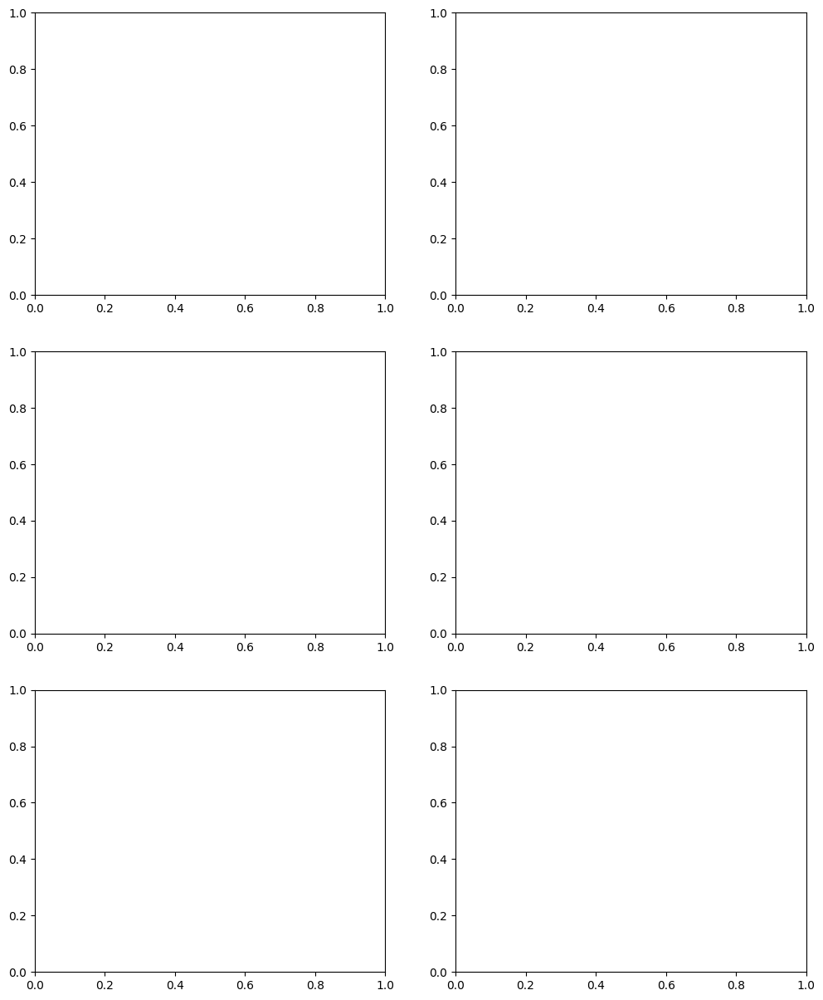

In [196]:
fig, axes = plt.subplots(3, 2, figsize=(12, 5*3))
axes = axes.flatten()


residuals = df_train['y_pred_outlier'] - df_train['y_true']
sns.residplot(x=df_train['y_true'], y=residuals, line_kws={"color": "red", "lw": 2}, scatter_kws={'s': 2}, ax=axes[0])
# axes[0].set_ylim(-0.025, 0.04)
axes[0].set_title(f'Train')
axes[0].axhline(0.005, color='red')
axes[0].axhline(-0.005, color='red')

large_residuals = np.where(residuals >= 0.005, 1,
                            np.where(residuals <= -0.005, 2, 0))
sns.histplot(x=df_train['y_true'], hue=large_residuals, kde=True, stat='probability', ax=axes[1])


residuals = df_val['y_pred_outlier'] - df_val['y_true']
sns.residplot(x=df_val['y_true'], y=residuals, line_kws={"color": "red", "lw": 2}, scatter_kws={'s': 2}, ax=axes[2])
# axes[2].set_ylim(-0.025, 0.04)
axes[2].set_title(f'Validation')
axes[2].axhline(0.005, color='red')
axes[2].axhline(-0.005, color='red')

large_residuals = np.where(residuals >= 0.005, 1,
                            np.where(residuals <= -0.005, 2, 0))
sns.histplot(x=df_val['y_true'], hue=large_residuals, kde=True, stat='probability', ax=axes[3])


residuals = df_test['y_pred_outlier'] - df_test['y_true']
sns.residplot(x=df_test['y_true'], y=residuals, line_kws={"color": "red", "lw": 2}, scatter_kws={'s': 2}, ax=axes[4])
# axes[4].set_ylim(-0.025, 0.04)
axes[4].set_title(f'Test')
axes[4].axhline(0.005, color='red')
axes[4].axhline(-0.005, color='red')

large_residuals = np.where(residuals >= 0.005, 1,
                            np.where(residuals <= -0.005, 2, 0))
sns.histplot(x=df_test['y_true'], hue=large_residuals, kde=True, stat='probability', ax=axes[5])

plt.show()

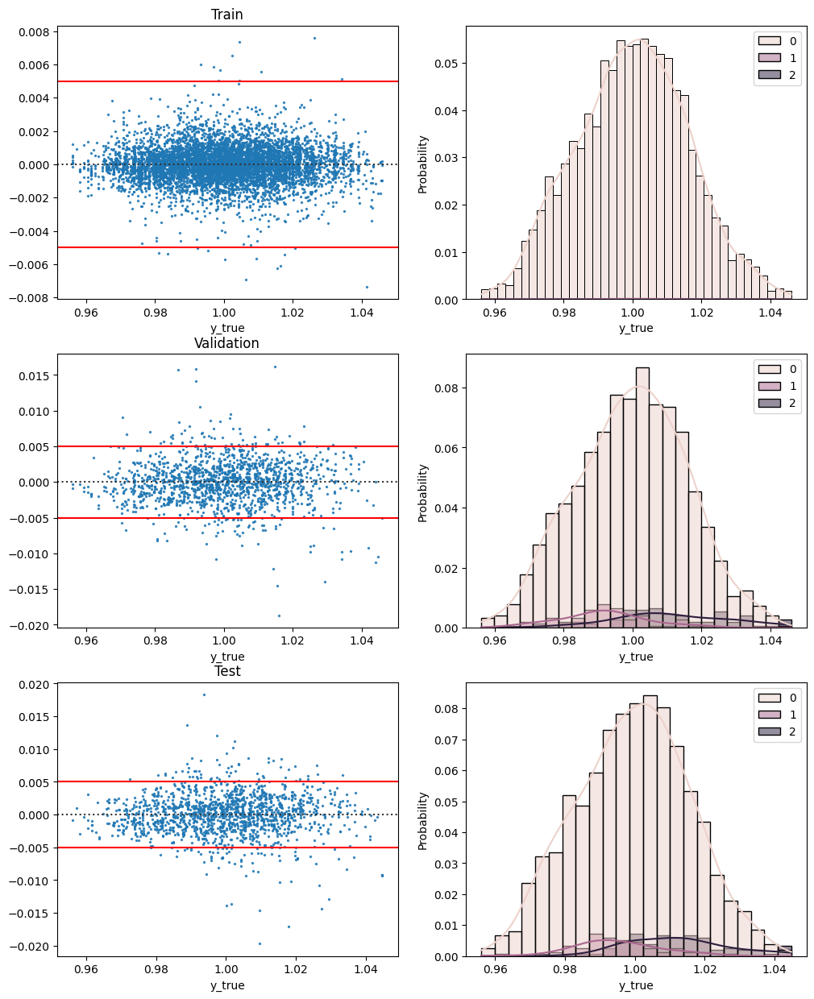

In [222]:
fig, axes = plt.subplots(3, 2, figsize=(12, 5*3))
axes = axes.flatten()


residuals = df_train['y_pred'] - df_train['y_true']
sns.residplot(x=df_train['y_true'], y=residuals, line_kws={"color": "red", "lw": 2}, scatter_kws={'s': 2}, ax=axes[0])
# axes[0].set_ylim(-0.025, 0.04)
axes[0].set_title(f'Train')
axes[0].axhline(0.005, color='red')
axes[0].axhline(-0.005, color='red')

large_residuals = np.where(residuals >= 0.005, 1,
                            np.where(residuals <= -0.005, 2, 0))
sns.histplot(x=df_train['y_true'], hue=large_residuals, kde=True, stat='probability', ax=axes[1])


residuals = df_val['y_pred'] - df_val['y_true']
sns.residplot(x=df_val['y_true'], y=residuals, line_kws={"color": "red", "lw": 2}, scatter_kws={'s': 2}, ax=axes[2])
# axes[2].set_ylim(-0.025, 0.04)
axes[2].set_title(f'Validation')
axes[2].axhline(0.005, color='red')
axes[2].axhline(-0.005, color='red')

large_residuals = np.where(residuals >= 0.005, 1,
                            np.where(residuals <= -0.005, 2, 0))
sns.histplot(x=df_val['y_true'], hue=large_residuals, kde=True, stat='probability', ax=axes[3])


residuals = df_test['y_pred'] - df_test['y_true']
sns.residplot(x=df_test['y_true'], y=residuals, line_kws={"color": "red", "lw": 2}, scatter_kws={'s': 2}, ax=axes[4])
# axes[4].set_ylim(-0.025, 0.04)
axes[4].set_title(f'Test')
axes[4].axhline(0.005, color='red')
axes[4].axhline(-0.005, color='red')

large_residuals = np.where(residuals >= 0.005, 1,
                            np.where(residuals <= -0.005, 2, 0))
sns.histplot(x=df_test['y_true'], hue=large_residuals, kde=True, stat='probability', ax=axes[5])

plt.show()

## Submission 

In [153]:
submission_data_path = '../Submission_template_UHI2025-v2.csv' 
test_file = pd.read_csv(submission_data_path)
test_file

,Longitude,Latitude,UHI Index
0,-73.971665,40.788763,NaN
1,-73.971928,40.788875,NaN
2,-73.967080,40.789080,NaN
3,-73.972550,40.789082,NaN
4,-73.969697,40.787953,NaN
...,...,...,...
1035,-73.919388,40.813803,NaN
1036,-73.931033,40.833178,NaN
1037,-73.934647,40.854542,NaN
1038,-73.917223,40.815413,NaN


In [154]:
test_data = test_file.copy()

In [155]:
data_folder = "../data_pipeline/data/tabular_data/submission/1x1"
for i, filename in tqdm(enumerate(os.listdir(data_folder))):
    if filename.endswith(".csv"):
        file_path = os.path.join(data_folder, filename)
        df = pd.read_csv(file_path)
        df = df.iloc[:, 2:]
        # print(df.columns)
        test_data = pd.concat([test_data, df], axis=1)


data_folder = "../data_pipeline/data/tabular_data/submission/3x3"
for i, filename in tqdm(enumerate(os.listdir(data_folder))):
    if filename.endswith(".csv"):
        file_path = os.path.join(data_folder, filename)
        df = pd.read_csv(file_path)
        df = df.iloc[:, 2:]
        # print(df.columns)
        test_data = pd.concat([test_data, df], axis=1)


data_folder = "../data_pipeline/data/tabular_data/submission/5x5"
for i, filename in tqdm(enumerate(os.listdir(data_folder))):
    if filename.endswith(".csv"):
        file_path = os.path.join(data_folder, filename)
        df = pd.read_csv(file_path)
        df = df.iloc[:, 2:]
        # print(df.columns)
        test_data = pd.concat([test_data, df], axis=1)


data_folder = "../data_pipeline/data/tabular_data/submission/9x9"
for i, filename in tqdm(enumerate(os.listdir(data_folder))):
    if filename.endswith(".csv"):
        file_path = os.path.join(data_folder, filename)
        df = pd.read_csv(file_path)
        df = df.iloc[:, 2:]
        # print(df.columns)
        test_data = pd.concat([test_data, df], axis=1)


data_folder = "../data_pipeline/data/tabular_data/submission/15x15"
for i, filename in tqdm(enumerate(os.listdir(data_folder))):
    if filename.endswith(".csv"):
        file_path = os.path.join(data_folder, filename)
        df = pd.read_csv(file_path)
        df = df.iloc[:, 2:]
        # print(df.columns)
        test_data = pd.concat([test_data, df], axis=1)


data_folder = "../data_pipeline/data/tabular_data/submission/25x25"
for i, filename in tqdm(enumerate(os.listdir(data_folder))):
    if filename.endswith(".csv"):
        file_path = os.path.join(data_folder, filename)
        df = pd.read_csv(file_path)
        df = df.iloc[:, 2:]
        # print(df.columns)
        test_data = pd.concat([test_data, df], axis=1)


data_folder = "../data_pipeline/data/tabular_data/submission/51x51"
for i, filename in tqdm(enumerate(os.listdir(data_folder))):
    if filename.endswith(".csv"):
        file_path = os.path.join(data_folder, filename)
        df = pd.read_csv(file_path)
        df = df.iloc[:, 2:]
        # print(df.columns)
        test_data = pd.concat([test_data, df], axis=1)

54it [00:01, 31.95it/s]
73it [00:02, 24.62it/s]
71it [00:04, 15.40it/s]
71it [00:04, 15.37it/s]
63it [00:03, 20.45it/s]
29it [00:01, 15.03it/s]
29it [00:01, 19.56it/s]


In [159]:
pred = rfe_pipeline3.predict(test_data[numerical_cols + categorical_cols])
# pred_lgbm = lgbm_pipeline3.predict(test_data[numerical_cols + categorical_cols])

# pred = p * pred + (1 - p) * pred_lgbm

# pred25 = rfe_pipeline25.predict(test_data[[col for col in df_train.columns if col.endswith("25x25")]])
# res_pred = rfe_pipeline_res.predict(test_data[numerical_cols + categorical_cols])
# pred = pred + res_pred + pred25

final_predictions = pd.Series(pred)
submission_df = pd.DataFrame({'Longitude':test_file['Longitude'].values, 'Latitude':test_file['Latitude'].values, 'UHI Index':final_predictions.values})

In [160]:
submission_df

,Longitude,Latitude,UHI Index
0,-73.971665,40.788763,0.964223
1,-73.971928,40.788875,0.963684
2,-73.967080,40.789080,0.963747
3,-73.972550,40.789082,0.968222
4,-73.969697,40.787953,0.958587
...,...,...,...
1035,-73.919388,40.813803,1.041249
1036,-73.931033,40.833178,1.043035
1037,-73.934647,40.854542,1.038862
1038,-73.917223,40.815413,1.038300


In [161]:
submission_df.to_csv("../submissions/xgb_street_type.csv", index = False)

## Residual Diagnose

In [354]:
feature = get_feature_names(preprocessor, numerical_cols, categorical_cols)
imp_df = pd.DataFrame({'feature': feature, 'imp': xgb3.feature_importances_})
imp_df = imp_df.sort_values(by='imp', ascending=False)

In [120]:
from sklearn.neighbors import LocalOutlierFactor
from scipy.stats import nct

# fit the model for novelty detection (novelty=True)
data_outlier = X_train.fillna(-1)

k_neighbors = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
c_points = [0.001, 0.005, 0.007, 0.01, 0.02, 0.03, 0.05]

# for c in c_points:    
#     for k in k_neighbors:
preprocessor = create_feature_engineering_pipeline(numerical_cols, categorical_cols)
lof = LocalOutlierFactor(n_neighbors=50, contamination=0.02)

outlier_pipeline = Pipeline([
                        ("preprocessor", preprocessor),
                        ("lof", lof)
                ])

df_train['outlier'] = outlier_pipeline.fit_predict(data_outlier)
df_train['lof'] = np.log(-lof.negative_outlier_factor_)

inliers = df_train[df_train['outlier'] == 1]
outliers = df_train[df_train['outlier'] == -1]

        # m = (np.mean(outliers['lof']) - np.mean(inliers['lof'])) / np.sqrt(np.var(outliers['lof']) / len(outliers) + np.var(inliers['lof']) / len(inliers))
        # df = (np.var(outliers['lof']) / len(outliers) + np.var(inliers['lof']) / len(inliers)) ** 2 / ((np.var(outliers['lof']) / len(outliers)) ** 2 / (len(outliers) -1 ) + (np.var(inliers['lof']) / len(inliers)) ** 2 / (len(inliers) -1 ))
        # quantile = nct.cdf(m, df, m)
        # print(f'k: {k}, contam: {0.003}, t-stat: {m}, quantile: {quantile}')
# df_val['outlier'] = outlier_pipeline.predict(data_outlier)
# df_test['outlier'] = outlier_pipeline.predict(data_outlier)

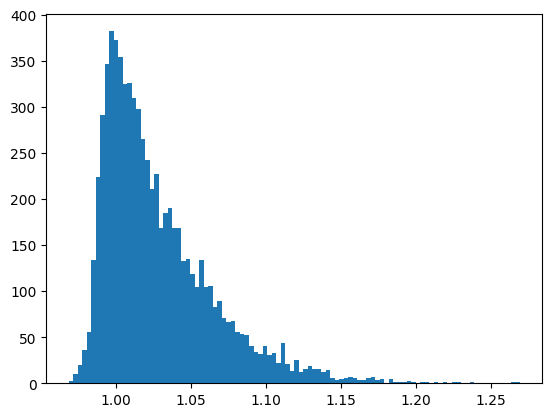

In [84]:
plt.hist(df_train['lof'], bins=100)
plt.show()

In [163]:
import branca.colormap as cm

df_train['lat'] = ground_df['Latitude']
df_train['long'] = ground_df['Longitude']

df_train['residual'] = df_train['y_pred'] - df_train['y_true']
df_train['large_residuals'] = np.where(df_train['residual'] < -0.005, 1, 
                           np.where(df_train['residual'] > 0.005, 2, 0))


m = folium.Map(location=[40.8, -73.5], zoom_start=7)

colormap = cm.LinearColormap(["green", "yellow", "red"], vmin=df_train['large_residuals'].min(), vmax=df_train['large_residuals'].max())
# Add points
for _, row in df_train.iterrows():

    folium.CircleMarker(
        location=[row["lat"], row["long"]],
        radius=1,
        color=colormap(row['large_residuals']), 
        fill=True,
        fill_opacity=0.7,
        tooltip=_,
    ).add_to(m)

colormap.add_to(m)

m

In [ ]:
all_val = pd.concat([df_val, df_test], axis=0)

all_val['lat'] = ground_df['Latitude']
all_val['long'] = ground_df['Longitude']

# all_val['residual'] = all_val['y_pred_outlier'] - all_val['y_true']
# all_val['large_residuals'] = np.where(all_val['residual'] < -0.005, 1, 
#                            np.where(all_val['residual'] > 0.005, 2, 0))


m = folium.Map(location=[40.8, -73.5], zoom_start=7)

colormap = cm.LinearColormap(["green", "yellow", "red"], vmin=all_val[''].min(), 
                             vmax=all_val['canopy_heigth_count_res30'].max())
# Add points
for _, row in all_val.iterrows():

    folium.CircleMarker(
        location=[row["lat"], row["long"]],
        radius=1,
        color=colormap(row['canopy_heigth_count_res30_mean_5x5']), 
        fill=True,
        fill_opacity=0.7,
        tooltip=_,
    ).add_to(m)

colormap.add_to(m)

m

KeyError: 'canopy_heigth_count_res30'

In [223]:
all_val['lat'] = ground_df['Latitude']
all_val['long'] = ground_df['Longitude']

all_val['residual'] = all_val['y_pred'] - all_val['y_true']
all_val['large_residuals'] = np.where(all_val['residual'] < -0.005, 1, 
                           np.where(all_val['residual'] > 0.005, 2, 0))


m = folium.Map(location=[40.8, -73.5], zoom_start=7)

colormap = cm.LinearColormap(["green", "yellow", "red"], vmin=all_val['large_residuals'].min(), vmax=all_val['large_residuals'].max())
# Add points
for _, row in all_val.iterrows():

    folium.CircleMarker(
        location=[row["lat"], row["long"]],
        radius=1,
        color=colormap(row['large_residuals']), 
        fill=True,
        fill_opacity=0.7,
        tooltip=_,
    ).add_to(m)

colormap.add_to(m)

m

In [390]:
data_outlier = df_train[df_train.columns[:-1]]
val_outlier = df_val[df_val.columns[:-1]]

In [406]:
import matplotlib
import matplotlib.lines as mlines

from sklearn.neighbors import LocalOutlierFactor

# fit the model for novelty detection (novelty=True)
data_outlier = data_outlier.fillna(-1)

preprocessor = create_feature_engineering_pipeline(numerical_cols, categorical_cols)
clf = LocalOutlierFactor(n_neighbors=20, contamination=0.05)

outlier_pipeline = Pipeline([
                        ("preprocessor", preprocessor),
                        ("rfe", clf)
                    ])

y_pred = outlier_pipeline.fit_predict(data_outlier)
# X_scores = clf.negative_outlier_factor_

In [407]:
data_outlier[y_pred == -1]

,street_orientation_res30,has_manufacture_res100,has_park_res100,has_residence_res100,has_commercial_res100,has_manufacture_res500,has_park_res500,has_residence_res500,has_commercial_res500,has_manufacture_res1000,...,landsat_8_awei_nsh_std_dev_51x51,landsat_8_awei_sh_std_dev_51x51,landsat_8_si_std_dev_51x51,landsat_8_ndbi_std_dev_51x51,landsat_8_ibi_std_dev_51x51,landsat_8_albedo_std_dev_51x51,y_true,lat,long,outlier
9718,-1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,...,0.383770,0.264327,0.285311,0.178867,0.889276,0.064957,1.025841,40.857455,-73.932403,-1
6204,2.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.377525,0.118863,0.262971,0.114321,0.708421,0.065002,0.971748,40.780143,-73.947008,-1
3233,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.248548,0.185920,0.132000,0.124786,0.759430,0.050582,1.007089,40.844913,-73.911843,-1
4178,2.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,...,0.198568,0.143257,0.117787,0.103705,0.766724,0.046631,1.019711,40.819687,-73.913332,-1
1222,2.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,...,0.366574,0.157972,0.270140,0.120616,0.779032,0.062680,0.992905,40.780098,-73.984397,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3236,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.248548,0.185920,0.132000,0.124786,0.759430,0.050582,1.007089,40.844903,-73.911688,-1
10106,-1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,...,0.348179,0.184387,0.212835,0.132243,0.819679,0.063511,1.015984,40.822433,-73.952438,-1
4658,3.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,...,0.228191,0.211431,0.171337,0.139301,0.793186,0.047053,1.017186,40.837872,-73.900622,-1
5795,-1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,...,0.384730,0.195555,0.314292,0.187282,0.770855,0.063969,0.985692,40.782612,-73.957698,-1
